# Planetary Computer Data: Western US Comparison

In [1]:
#!mamba install -y py3dep

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import scipy
from dask.distributed import Client
import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr
from datetime import datetime
#import ulmo
from datetime import datetime
import sys
import contextily as ctx
import rioxarray as rxr
#from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib
import matplotlib.transforms as mtransforms
import logging
import ipyleaflet
import planetary_computer
import requests
from IPython.display import Image
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils

In [3]:
#bbox_gdf = gpd.read_file('../input/shapefiles/mt_rainier.geojson')
#ts_ds = get_s1_rtc_stac_pc(bbox_gdf,start_time='2019-01-01',end_time='2020-01-01',polarization='vv') # change year
#ts_ds
#ts_ds.isel(time=0).plot(vmin=0,vmax=5)

In [4]:
def get_s1_rtc_stac_pc(bbox_gdf,start_time='2014-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='vv'):
    '''
    Returns a Sentinel-1 SAR backscatter xarray dataset using STAC data from Indigo over the given time and bounding box.

            Parameters:
                    bbox_gdf (geopandas GeoDataframe): geodataframe bounding box
                    start_time (str): start time of returned data 'YYYY-MM-DD'
                    end_time (str): end time of returned data 'YYYY-MM-DD'
                    orbit_direction (str): orbit direction of S1--can be all, ascending, or decending
                    polarization (str): SAR polarization, use gamma0_vv
                    collection (str): points to json collection, will be different for each MGRS square

            Returns:
                    scenes (xarray dataset): xarray stack of all scenes in the specified spatio-temporal window
    '''
    
    
    #bbox = [-80.11, 8.71, -79.24, 9.38]
    #search = catalog.search(collections=["sentinel-1-rtc"], bbox=bbox, datetime="2022-05-02/2022-05-09")
    #items = search.item_collection()
    #ds = stackstac.stack(items, bounds_latlon=bbox, epsg=32610, resolution=10)
    #ds
    catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,)
    #bbox = [-80.11, 8.71, -79.24, 9.38]
    bbox = bbox_gdf.total_bounds
    search = catalog.search(collections=["sentinel-1-rtc"], bbox=bbox, datetime=f"{start_time}/{end_time}")
    items = search.item_collection()
    stack = stackstac.stack(items, bounds_latlon=bbox, epsg=32610, resolution=20)
    bounding_box_utm_gf = bbox_gdf.to_crs(stack.crs)
    xmin, ymax, xmax, ymin = bounding_box_utm_gf.bounds.values[0]
    scenes = stack.sel(band=polarization).sel(x=slice(xmin,xmax),y=slice(ymin,ymax))
        
    #if orbit_direction == 'all':
    #    scenes = scenes
    #else:
    #    scenes = scenes.where(scenes.coords['sat:orbit_state']==orbit_direction,drop=True)
    return scenes

In [5]:
def get_runoff_onset(ts_ds,return_seperate_orbits=False):
    
    ts_ds = ts_ds.fillna(9999)
    mins_info_runoff = ts_ds.argmin(dim='time',skipna=True)
    runoff_dates = ts_ds[mins_info_runoff].time
    
    year = ts_ds.time[0].dt.year.values
    unique_full_coverage = []
    melt_season = slice(f'{year}-03-01',f'{year}-08-01')
    
    for orbit in np.unique(ts_ds['sat:relative_orbit']):
        if len(ts_ds[ts_ds['sat:relative_orbit']==orbit].sel(time=melt_season).time.values) > 4:
            unique_full_coverage.append(orbit)
    unique_full_coverage = np.array(unique_full_coverage)
    
    runoff_dates = runoff_dates.expand_dims(dim={"orbit":unique_full_coverage},axis=2).copy()
    
    print(unique_full_coverage)
    for orbit in unique_full_coverage:
        ts_ds_orbit = ts_ds[ts_ds['sat:relative_orbit']==orbit]
        mins_info_runoff = ts_ds_orbit.argmin(dim='time',skipna=True)
        runoff_dates.loc[:,:,orbit] = ts_ds_orbit[mins_info_runoff].time
        
    if return_seperate_orbits == False:
        runoff_dates = runoff_dates.astype(np.int64).mean(axis=2,skipna=True).astype('datetime64[ns]') # changed to nanmean
    else:
        runoff_dates = runoff_dates
        
    runoff_dates = runoff_dates.where(ts_ds.min(dim='time')!=9999)

In [6]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
sys.modules.pop('s1_rtc_bs_utils')
import s1_rtc_bs_utils

In [7]:
from distributed import Client
import dask_gateway

cluster = dask_gateway.GatewayCluster()
client = cluster.get_client()
cluster.adapt(minimum=2, maximum=300)

print(client.dashboard_link)

https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.fa20bfbe7cb7414e8355d041e14acf72/status


In [8]:
#gj = '../input/shapefiles/olympic_peninsula.geojson'
#gj = '../input/shapefiles/wa.geojson'

#bbox_gdf = gpd.read_file(gj)

In [9]:
#ts_ds = get_s1_rtc_stac_pc(bbox_gdf,start_time='2018-01-01',end_time='2018-12-31',polarization='vv')

In [10]:
#ts_ds

In [11]:
#f,ax=plt.subplots(figsize=(30,7))
#s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)

In [12]:
#%%time
#ts_ds = ts_ds.compute()
#ts_ds = ts_ds.dropna('time',how='all')

In [13]:
#%%time
#runoff = get_runoff_onset(ts_ds).dt.dayofyear

In [14]:
#f,ax=plt.subplots()
#runoff.plot(ax=ax,vmin=60,vmax=200)

In [15]:
# comment out
fontsize=19

font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : fontsize}

matplotlib.rc('font', **font)

In [16]:
rainier_bbox_gdf = gpd.read_file('../input/shapefiles/mt_rainier.geojson')
baker_bbox_gdf = gpd.read_file('../input/shapefiles/mt_baker.geojson')
helens_bbox_gdf = gpd.read_file('../input/shapefiles/mt_st_helens.geojson')
#grandmesa_bbox_gdf = gpd.read_file('../input/shapefiles/grandmesa.geojson')

In [17]:
names = ['Mt. Baker (48.78N)',
         'Glacier Peak (48.11N)',
         'Mt. Rainier (46.85N)',
         'Mt. Adams (46.20N)',
         'Mt. St. Helens (46.19N)',
         'Mt. Hood (45.37N)',
         'Mt. Jefferson (44.67N)',
         'Three Sisters (44.10N-44.17N)',
         #'Crater Lake (42.95N)',
         'Mt. Shasta (41.41N)',
         'Lassen Peak (40.49N)',]

geojsons = ['../input/shapefiles/mt_baker.geojson',
            '../input/shapefiles/glacier_peak.geojson',
            '../input/shapefiles/mt_rainier.geojson',
            '../input/shapefiles/mt_adams.geojson',
            '../input/shapefiles/mt_st_helens.geojson',
            '../input/shapefiles/mt_hood.geojson',
            '../input/shapefiles/mt_jefferson.geojson',
            '../input/shapefiles/three_sisters.geojson',
            #'../input/shapefiles/crater_lake.geojson',
            '../input/shapefiles/mt_shasta.geojson',
            '../input/shapefiles/lassen_peak.geojson',]

CPU times: user 33.9 s, sys: 3.6 s, total: 37.5 s
Wall time: 1min 6s


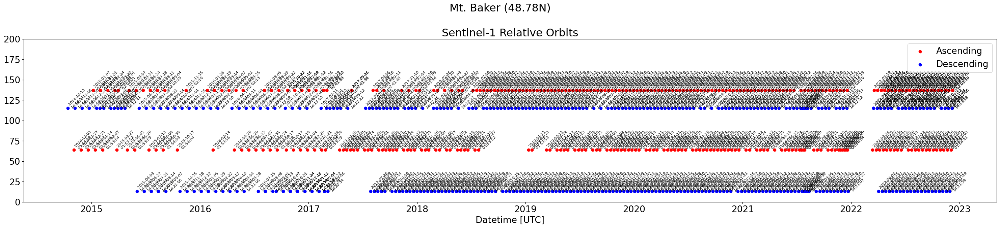

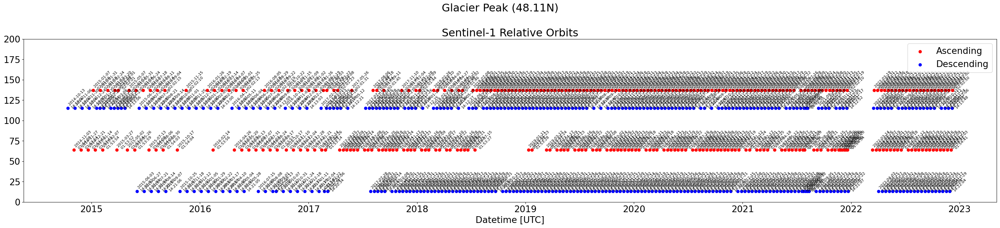

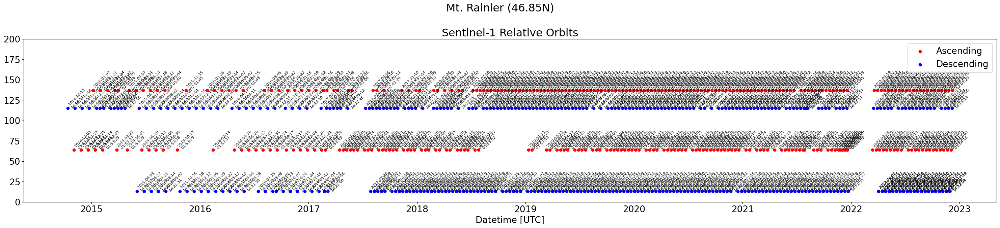

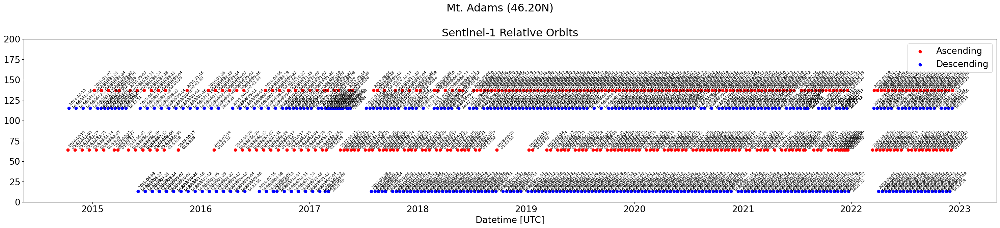

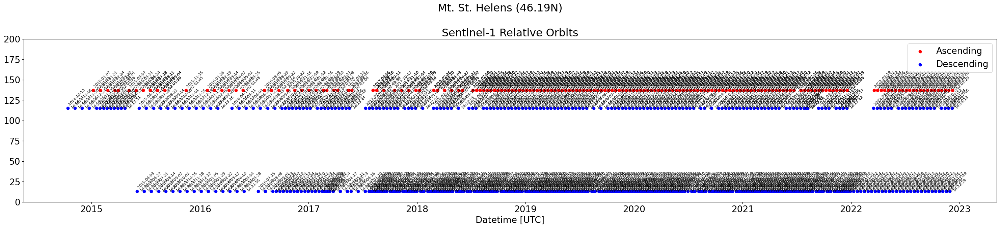

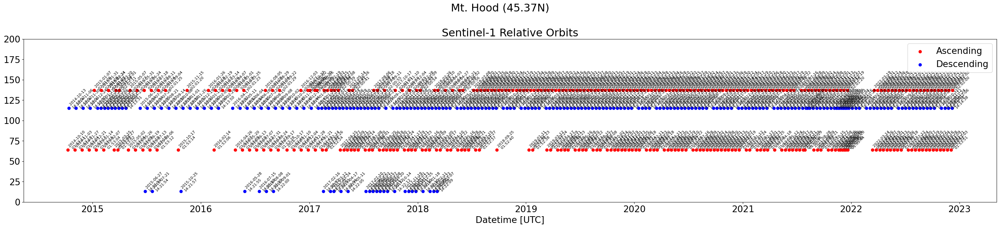

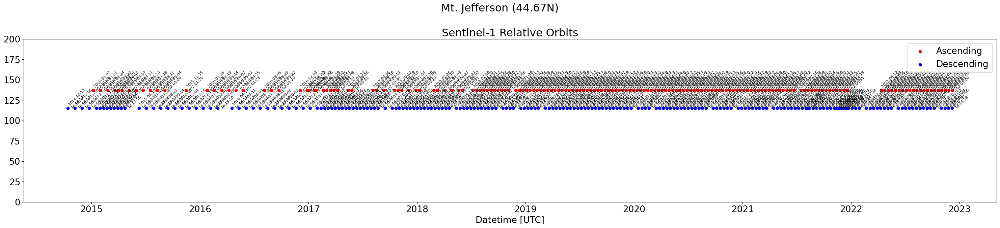

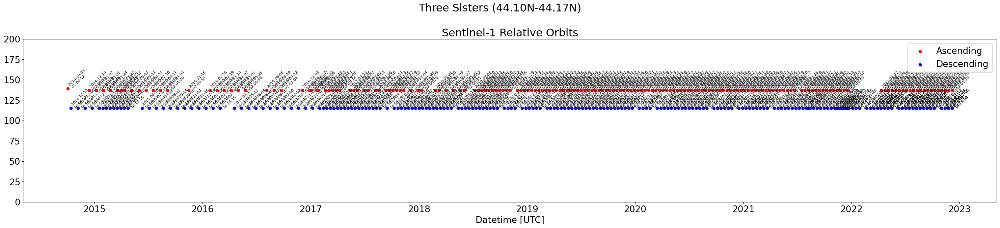

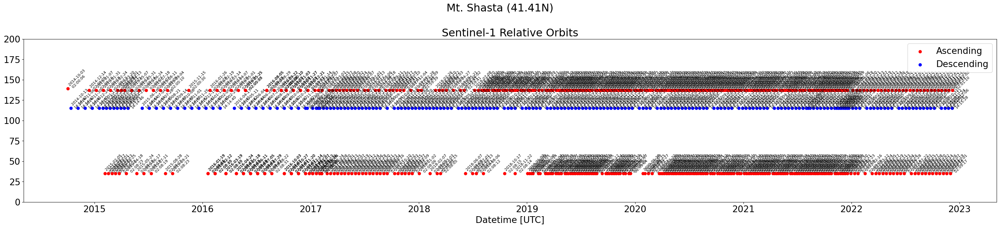

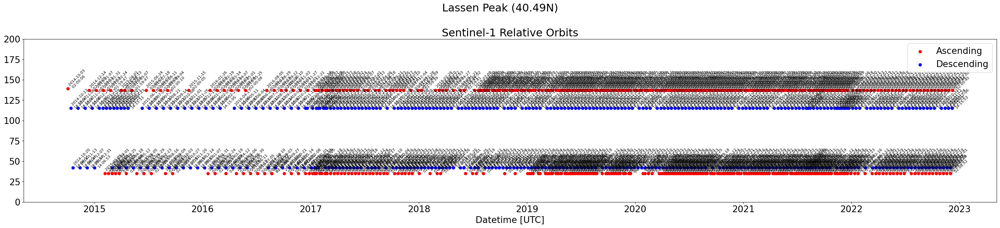

In [18]:
%%time
for nm, gj in zip(names,geojsons):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2014-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),polarization='vv')
    #ts_ds = ts_ds.compute()
    #ts_ds = ts_ds.dropna('time',how='all')
    
    f,ax=plt.subplots(figsize=(30,7))
    
    s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)
    f.suptitle(f'{nm}')
    plt.tight_layout()

In [19]:
fontsize=19

font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : fontsize}

matplotlib.rc('font', **font)

In [20]:
# now do elevation-meltday curve for each year and each mountain

In [21]:
for nm, gj in zip(names,geojsons):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2014-01-01',end_time='2022-01-01',orbit_direction='all',polarization='vv')
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2)
    dem = dem.where(summer_ndvi_ds.values<0.2)
    
    if nm == 'Mt. Hood (45.37N)':
        ts_ds = ts_ds[ts_ds['sat:relative_orbit']==137]
    
    f,ax=plt.subplots(figsize=(7,7))
    for year in ['2017','2018','2019','2020']:
        time_slice = slice(f'{year}-01-01',f'{year}-12-01')
        ts_ds_clipped = ts_ds.sel(time=time_slice)
        runoff_onset_map = s1_rtc_bs_utils.get_runoff_onset(ts_ds_clipped).dt.dayofyear
        dem_and_runoff_df = pd.DataFrame((dem.to_numpy().ravel(),runoff_onset_map.to_numpy().ravel())).T.dropna()
        dem_and_runoff_df.columns = ['Elevation','Runoff DOY']
        
        dem_and_runoff_df.groupby(pd.qcut(dem_and_runoff_df["Elevation"], 20)).mean().plot(ax=ax,x='Runoff DOY',y='Elevation',label=f'{year}')
    ax.set_xlim([0,365])
    ax.set_ylim([0,4500])
    ax.set_title(f'{nm} Elevation vs. Runoff Date')
    

KeyboardInterrupt: 

In [ ]:
# f,ax=plt.subplots(figsize=(20,20))
# for nm, gj, colls,colors in zip(names,geojsons,collections,['red','green','blue','orange']):
#     bbox_gdf = gpd.read_file(gj)
#     ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2014-01-01',end_time='2022-01-01',orbit_direction='all',polarization='gamma0_vv',collection=colls)
#     ts_ds = ts_ds.compute()
#     ts_ds = ts_ds.dropna('time',how='all')
    
#     summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
#     dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
#     ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2)
#     dem = dem.where(summer_ndvi_ds.values<0.2)
    
#     for year,alpha in zip(['2017','2018','2019','2020'],[0.4,0.6,0.8,1]):
#         time_slice = slice(f'{year}-01-01',f'{year}-12-01')
#         ts_ds_clipped = ts_ds.sel(time=time_slice)
#         runoff_onset_map = s1_rtc_bs_utils.get_runoff_onset(ts_ds_clipped).dt.dayofyear
#         dem_and_runoff_df = pd.DataFrame((dem.to_numpy().ravel(),runoff_onset_map.to_numpy().ravel())).T.dropna()
#         dem_and_runoff_df.columns = ['Elevation','Runoff DOY']
        
#         dem_and_runoff_df.groupby(pd.cut(dem_and_runoff_df["Elevation"], 20)).mean().plot(ax=ax,x='Runoff DOY',y='Elevation',label=f'{nm} ({year})',color=colors,alpha=alpha)
#     ax.set_xlim([0,365])
#     ax.set_ylim([0,4500])
#     ax.set_title(f'Western US Elevation vs. Runoff Date')
    

In [23]:
plt.style.use('seaborn-poster')
#plt.style.use('default')

In [ ]:
f,ax=plt.subplots(figsize=(12,15))

ff,axax = plt.subplots(5,2,figsize=(12,20))

    
for nm, gj, axs in zip(names,geojsons, axax.ravel()):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = get_s1_rtc_stac_pc(bbox_gdf,start_time='2019-01-01',end_time='2019-12-30',polarization='vv') # change year
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.5)
    dem = dem.where(summer_ndvi_ds.values<0.5)
    
    year = '2020'
    
    time_slice = slice(f'{year}-01-01',f'{year}-12-01')
    ts_ds_clipped = ts_ds.sel(time=time_slice)
    
    
    runoff_onset_map = s1_rtc_bs_utils.get_runoff_onset(ts_ds_clipped).dt.dayofyear
    dem_and_runoff_df = pd.DataFrame((dem.to_numpy().ravel(),runoff_onset_map.to_numpy().ravel())).T.dropna()
    dem_and_runoff_df.columns = ['Elevation','Runoff DOY']
        
    dem_and_runoff_df.groupby(pd.qcut(dem_and_runoff_df["Elevation"], 10)).mean().plot(ax=ax,x='Runoff DOY',y='Elevation',label=f'{nm}') # mean median, num of bins, #qcut
    
    runoff_onset_map.plot(ax=axs,cmap='viridis',vmin=60,vmax=220,add_colorbar=False) # change to 0,365
    axs.set_aspect('equal')
    axs.set_title(f'{nm}')
    ctx.add_basemap(ax=axs, crs=ts_ds_clipped.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
    axs.set_xlabel('')
    axs.set_ylabel('')
    axs.axis('off')
    
    print(f'{nm} complete')
    
#ax.set_xlim([50,250])
#ax.set_ylim([0,4500])

ax.set_xlim([75,200])
ax.set_ylim([1000,4000])

ax.set_title(f'Evolution of {year} Snowmelt Runoff Onset')


ax.set_xlabel(f'{year} Snowmelt Runoff Onset [DOY]')
ax.set_ylabel(f'Elevation [m]')    
ax.grid()

In [ ]:
for nm, gj, axs in zip(names,geojsons, axax.ravel()):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = get_s1_rtc_stac_pc(bbox_gdf,start_time='2019-01-01',end_time='2020-01-01',polarization='vv') # change year
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    #incidence = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2020-01-01',end_time='2021-01-01',orbit_direction='ascending',polarization='incidence',collection=colls)

    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.5) # 0.2
    #ts_ds = ts_ds.where(incidence.isel(time=0).values/100>20)
    dem = dem.where(summer_ndvi_ds.values<0.5) # 0.2
    
    
    stats_df = s1_rtc_bs_utils.get_stats(ts_ds)
    stats_df = stats_df.drop(columns=['ripening_dates','runoff_prediction','ripening_prediction'])
    print(stats_df.corr())
    
    predictors = np.append(np.ones_like([stats_df['runoff_dates']]).T,stats_df.loc[:,['elevation','dah']].to_numpy(),axis=1)
    B,_,_,_ = scipy.linalg.lstsq(predictors, stats_df.loc[:,'runoff_dates'])
    print(f'For {nm} during 2020, the runoff onset date is predicted {B[1]*100} days later for every 100m of elevation gain.')

## Now do 2017-2021 Averages

KeyboardInterrupt: 

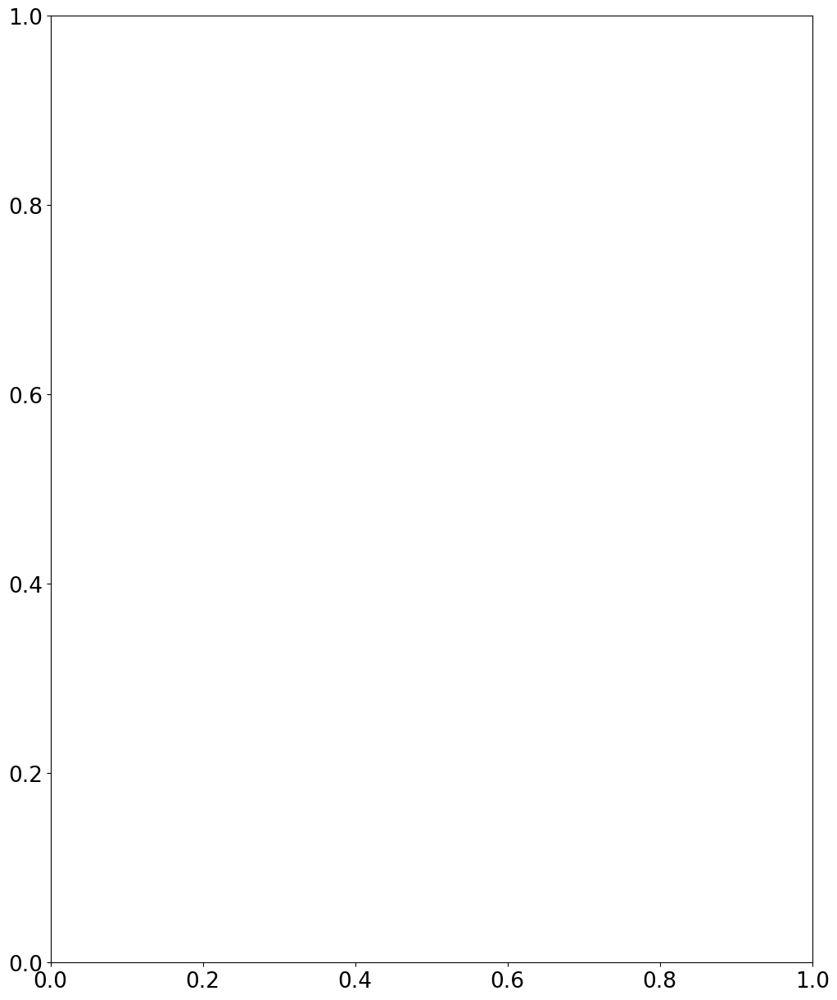

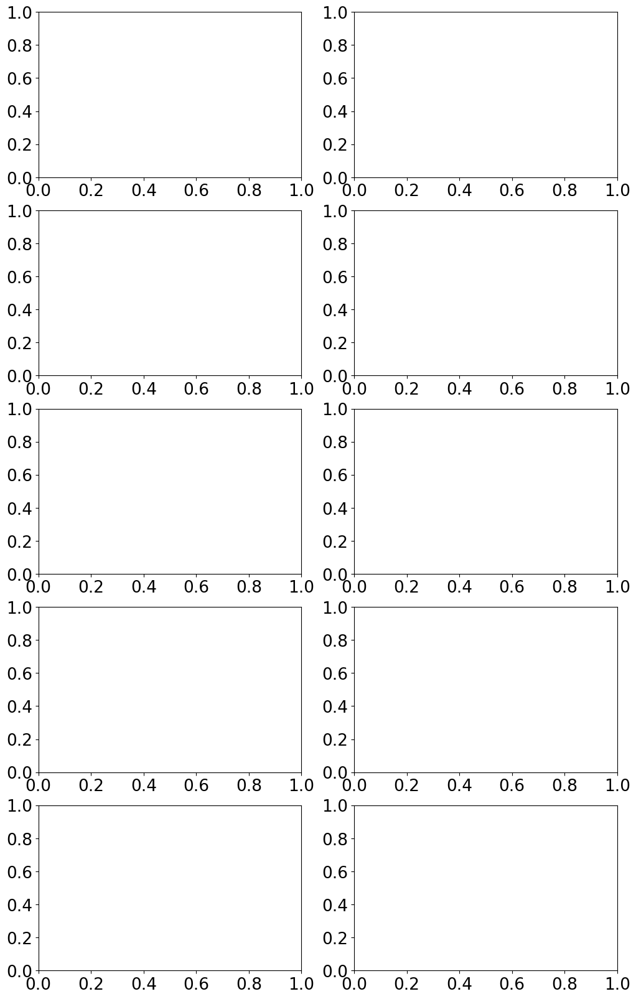

In [22]:
f,ax=plt.subplots(figsize=(12,15))

ff,axax = plt.subplots(5,2,figsize=(12,20))

    
for nm, gj, axs in zip(names,geojsons, axax.ravel()):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2015-01-01',end_time='2021-12-31',polarization='vv') # change year
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.5)
    dem = dem.where(summer_ndvi_ds.values<0.5)
    
    
    year='2015'
    time_slice = slice(f'{year}-01-01',f'{year}-12-31')
    ts_ds_clipped = ts_ds.sel(time=time_slice)
    runoff_onset_map_fouryears = s1_rtc_bs_utils.get_runoff_onset(ts_ds_clipped).dt.dayofyear
    
            
            
    for year in ['2016','2017','2018','2019','2020','2021']:
    
        time_slice = slice(f'{year}-01-01',f'{year}-12-31')
        ts_ds_clipped = ts_ds.sel(time=time_slice)
    
    
        runoff_onset_map_fouryears = runoff_onset_map_fouryears + s1_rtc_bs_utils.get_runoff_onset(ts_ds_clipped).dt.dayofyear
        
    runoff_onset_map = runoff_onset_map_fouryears/7
    
    
    
    dem_and_runoff_df = pd.DataFrame((dem.to_numpy().ravel(),runoff_onset_map.to_numpy().ravel())).T.dropna()
    dem_and_runoff_df.columns = ['Elevation','Runoff DOY']
        
    dem_and_runoff_df.groupby(pd.qcut(dem_and_runoff_df["Elevation"], 10)).median().plot(ax=ax,x='Runoff DOY',y='Elevation',label=f'{nm}') # mean median, num of bins, #qcut
    
    runoff_onset_map.plot(ax=axs,cmap='viridis',vmin=90,vmax=220,add_colorbar=False) # change to 0,365
    axs.set_aspect('equal')
    axs.set_title(f'{nm}')
    ctx.add_basemap(ax=axs, crs=ts_ds_clipped.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
    axs.set_xlabel('')
    axs.set_ylabel('')
    axs.axis('off')
    
    print(f'{nm} complete')
    
#ax.set_xlim([50,250])
#ax.set_ylim([0,4500])

ax.set_xlim([75,200])
ax.set_ylim([1000,4000])

ax.set_title(f'Evolution of 2015-2022 Snowmelt Runoff Onset')


ax.set_xlabel(f'Median Snowmelt Runoff Onset [DOY]')
ax.set_ylabel(f'Elevation [m]')    
ax.grid()

In [ ]:
%%time

for nm, gj, colls, axs in zip(names,geojsons,collections, axax.ravel()):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2015-01-01',end_time='2021-12-31',polarization='vv',resolution=20) # change year
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    #incidence = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2020-01-01',end_time='2021-01-01',orbit_direction='ascending',polarization='incidence',collection=colls)

    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.5) # 0.2 0.5 best rn 0.6?
    #ts_ds = ts_ds.where(incidence.isel(time=0).values/100>20)
    dem = dem.where(summer_ndvi_ds.values<0.5) # 0.2
    
    
    stats_df = s1_rtc_bs_utils.get_stats(ts_ds,multiple_years=True)
    stats_df = stats_df.drop(columns=['ripening_dates','runoff_prediction','ripening_prediction'])
    print(stats_df.corr())
    
    predictors = np.append(np.ones_like([stats_df['runoff_dates']]).T,stats_df.loc[:,['elevation','dah']].to_numpy(),axis=1)
    B,_,_,_ = scipy.linalg.lstsq(predictors, stats_df.loc[:,'runoff_dates'])
    print(f'For {nm} during 2015-2022, the average runoff onset date is predicted {B[1]*100:.2f} days later for every 100m of elevation gain.')

In [ ]:
def get_runoff_onset(ts_ds,return_seperate_orbits=False):
    
    ts_ds = ts_ds.fillna(9999)
    mins_info_runoff = ts_ds.argmin(dim='time',skipna=True)
    runoff_dates = ts_ds[mins_info_runoff].time
    runoff_dates = runoff_dates.expand_dims(dim={"orbit":np.unique(ts_ds['sat:relative_orbit'])},axis=2).copy()
    
    for orbit in np.unique(ts_ds['sat:relative_orbit']):
        ts_ds_orbit = ts_ds[ts_ds['sat:relative_orbit']==orbit]
        mins_info_runoff = ts_ds_orbit.argmin(dim='time',skipna=True)
        runoff_dates.loc[:,:,orbit] = ts_ds_orbit[mins_info_runoff].time
        
    if return_seperate_orbits == False:
        runoff_dates = runoff_dates.astype(np.int64).mean(axis=2).astype('datetime64[ns]')
    else:
        runoff_dates = runoff_dates
        
    runoff_dates = runoff_dates.where(ts_ds.isel(time=0)!=9999)
    
    return runoff_dates

In [ ]:
runoff = get_runoff_onset(ts_ds,return_seperate_orbits=False)

In [ ]:
runoff

In [ ]:
f,ax=plt.subplots()
runoff.plot(ax=ax,vmin=60,vmax=200)

In [ ]:
runoff = get_runoff_onset(ts_ds,return_seperate_orbits=True).dt.dayofyear
f,ax=plt.subplots(2)
runoff[:,:,0].plot(ax=ax[0],vmin=60,vmax=200)
runoff[:,:,1].plot(ax=ax[1],vmin=60,vmax=200)

In [ ]:
f,ax=plt.subplots()
runoff = s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear
runoff.plot(ax=ax,vmin=60,vmax=200)

In [ ]:
runoff

In [ ]:
for orbit in np.unique(ts_ds['sat:relative_orbit']):
    print(orbit)

In [ ]:
mins_info_runoff = ts_ds.fillna(9999).argmin(dim='time',skipna=True)
runoff_dates = ts_ds[mins_info_runoff].time

In [ ]:
runoff_dates.values

In [ ]:
xr.DataArray(data=None,coords=runoff_dates.coords)